## Imports

In [21]:
import os
import cv2
import copy
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt

from tensorflow.keras import layers, losses
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv2D, concatenate

# Data Pipeline


In [5]:
# hyper-parameters

img_size = 224
miss_size = 200
img_channels = 3
missing_rate = 0.9
splitting_rate = 0.8
window_len = 200
# csi_matrix_shape = (window_len, 208)
rssi_vector_shape = (window_len, 1)

In [6]:
%cd /mnt/nas/Project_02/Datasets/Indoors
!ls


# images
raw_img = np.load('./camera_1/raw_img_(224_224).npy', allow_pickle=True, encoding="latin1") 


# # CSI
# csi_01 = np.load('./CSI/amp_01.npy', allow_pickle=True, encoding="latin1")
# csi_02 = np.load('./CSI/amp_02.npy', allow_pickle=True, encoding="latin1")
# csi_03 = np.load('./CSI/amp_03.npy', allow_pickle=True, encoding="latin1")
# csi_04 = np.load('./CSI/amp_04.npy', allow_pickle=True, encoding="latin1")

# csi_05 = np.load('./CSI/amp_05.npy', allow_pickle=True, encoding="latin1")
# csi_06 = np.load('./CSI/amp_06.npy', allow_pickle=True, encoding="latin1")
# csi_07 = np.load('./CSI/amp_07.npy', allow_pickle=True, encoding="latin1")
# csi_08 = np.load('./CSI/amp_08.npy', allow_pickle=True, encoding="latin1")
# csi_09 = np.load('./CSI/amp_09.npy', allow_pickle=True, encoding="latin1")


/mnt/nas/Project_02/Datasets/Indoors
230125_2   CSI	 camera_1  camera_3	mask256x256_2  steps
Baselines  RSSI  camera_2  mask256x256	single_img


In [7]:
# RSSI
rssi_01 = np.load('./RSSI/rssi_01.npy', allow_pickle=True, encoding="latin1")
rssi_02 = np.load('./RSSI/rssi_02.npy', allow_pickle=True, encoding="latin1")
rssi_03 = np.load('./RSSI/rssi_03.npy', allow_pickle=True, encoding="latin1")
rssi_04 = np.load('./RSSI/rssi_04.npy', allow_pickle=True, encoding="latin1")

# rssi_05 = np.load('./RSSI/rssi_05.npy', allow_pickle=True, encoding="latin1")
# rssi_06 = np.load('./RSSI/rssi_06.npy', allow_pickle=True, encoding="latin1")
# rssi_07 = np.load('./RSSI/rssi_07.npy', allow_pickle=True, encoding="latin1")
# rssi_08 = np.load('./RSSI/rssi_08.npy', allow_pickle=True, encoding="latin1")
# rssi_09 = np.load('./RSSI/rssi_09.npy', allow_pickle=True, encoding="latin1")


In [8]:
# test

print(rssi_01.shape)
print(rssi_03.shape)
print(rssi_09.shape)

(12000,)
(12000,)
(12000,)


In [9]:
def making_rssi_vector(rssi):
 
    train_rssi_set = []
    test_rssi_set = []
    
    total_rssi_num = rssi.shape[0]
    time_stamp = int(splitting_rate*total_rssi_num) 
    
    for count in range(int(0.5*window_len), time_stamp-int(0.5*window_len)): 
        train_rssi_matrix = []
        for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
            train_rssi_matrix.append(rssi[i])
        train_rssi_set.append(train_rssi_matrix)
       

    for count in range(time_stamp + int(0.5*window_len), int(total_rssi_num-window_len*0.5)):  
        test_rssi_matrix = []
        for i in range(count-int(0.5*window_len), count+int(0.5*window_len)):
            test_rssi_matrix.append(rssi[i])
        test_rssi_set.append(test_rssi_matrix) 
    
    
    train_rssi_set = np.array(train_rssi_set)
    test_rssi_set = np.array(test_rssi_set)
    
    return train_rssi_set, test_rssi_set


train_rssi_set_01, test_rssi_set_01 =  making_rssi_vector(rssi_01)
train_rssi_set_02, test_rssi_set_02 =  making_rssi_vector(rssi_02)
train_rssi_set_03, test_rssi_set_03 =  making_rssi_vector(rssi_03)
train_rssi_set_04, test_rssi_set_04 =  making_rssi_vector(rssi_04)

In [10]:
# test 

print(train_rssi_set_01.shape)
print(test_rssi_set_01.shape)

(9400, 200)
(2200, 200)


In [11]:
def image_splitter(img_set):

    train_gd_img = []
    test_gd_img = []
    
    total_img_num = img_set.shape[0]
    time_stamp = int(splitting_rate*total_img_num) 

    for count in range(int(0.5*window_len), int(time_stamp-window_len*0.5)):  
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        train_gd_img.append(img_set[count]) 
       
    for count in range(time_stamp + int(0.5*window_len), int(total_img_num-window_len*0.5)): 
        img_set[count] = cv2.cvtColor(img_set[count], cv2.COLOR_BGR2RGB)     
        test_gd_img.append(img_set[count]) 
    
    
    train_gd_img = np.array(train_gd_img)
    test_gd_img = np.array(test_gd_img)
    
    return train_gd_img, test_gd_img


train_gd_img, test_gd_img = image_splitter(raw_img)

In [12]:
# test 
print(train_gd_img.shape)
print('num of train_img:', len(train_gd_img))
print('num of test_img:', len(test_gd_img))
print('type of train_img:', type(train_gd_img))

(9400, 224, 224, 3)
num of train_img: 9400
num of test_img: 2200
type of train_img: <class 'numpy.ndarray'>


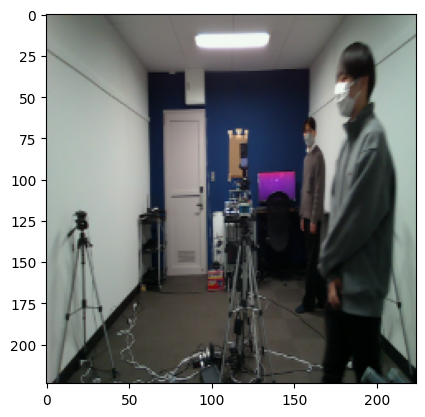

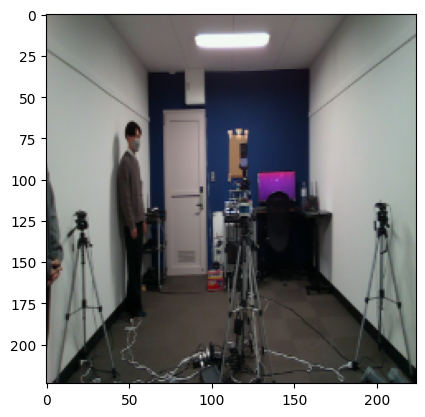

In [13]:
# test 

plt.imshow(train_gd_img[0])
plt.show()

plt.imshow(test_gd_img[0])
plt.show()

In [14]:
def get_blocked_img(img_set):
    
    blocked_img_set = []
    
    for raw_image in img_set:
        img = copy.deepcopy(raw_image)
        img[:, :miss_size , :] = 0
        blocked_img_set.append(img)

    blocked_img_set = np.array(blocked_img_set)

    return blocked_img_set

train_blocked_img = get_blocked_img(train_gd_img)
test_blocked_img = get_blocked_img(test_gd_img)

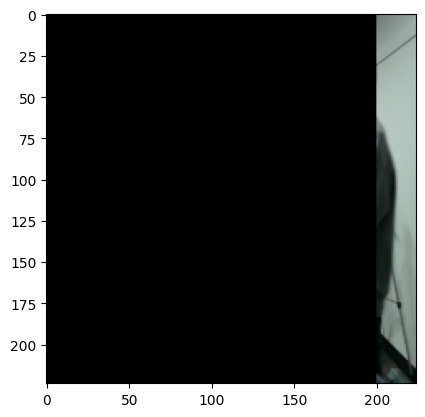

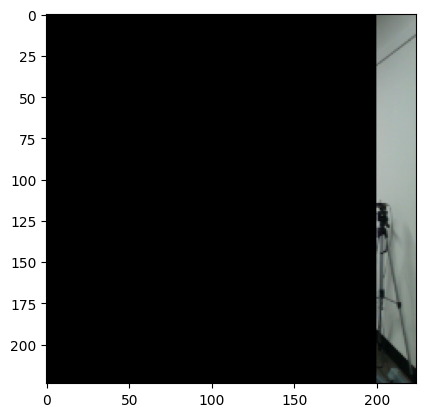

In [15]:
# test 

plt.imshow(train_blocked_img[0])
plt.show()

plt.imshow(test_blocked_img[0])
plt.show()

# Model Utility

In [16]:
# Hyperparameters

transformer_layers = 8
num_heads = 4
projection_dim = 1000
transformer_units = [projection_dim * 2, projection_dim]
transformer_layers = 8
mlp_head_units = [2048, 1024]  
learning_rate = 0.001
batch_size = 32
num_epochs = 50


# Pretrained Model
MODEL_PATH = "https://tfhub.dev/sayakpaul/swin_base_patch4_window7_224_fe/1"

In [22]:
def mlp_1(x, hidden_units, dropout_rate):
    for units in hidden_units:
        x = layers.Dense(units, activation=tf.nn.gelu)(x)
        x = layers.Dropout(dropout_rate)(x)
    return x

def mlp_2(input):
    x = layers.BatchNormalization()(input)
    x = layers.Dense(2048, activation='relu')(x)
    x = layers.Dense(1024, activation='relu')(x)
    x = layers.Dense(784, activation='relu')(x)
    output = layers.Reshape([28, 28, 1])(x)
    return output

def Transformer(rssi_1, rssi_2, rssi_3, rssi_4, transformer_layers, num_heads, projection_dim, transformer_units):
    rssi = layers.Concatenate()([rssi_1, rssi_2, rssi_3, rssi_4])
    encoded_input = layers.Dense(units=projection_dim)(rssi)

    for i in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_input)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.1)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_input])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        x3 = mlp_1(x3, hidden_units=transformer_units, dropout_rate=0.1)
        representation = layers.Add()([x3, x2])

    representation = layers.LayerNormalization(epsilon=1e-6)(representation)
    representation = layers.Flatten()(representation)
    representation = layers.Dropout(0.5)(representation)
    output = mlp_2(representation)
    return output
    

# Define the model creation function
def CSI_Inpainter(model_url, image_size, transformer_layers, num_heads, projection_dim, transformer_units):

    # input 
    rssi_1 = Input(shape=rssi_vector_shape)
    rssi_2 = Input(shape=rssi_vector_shape)
    rssi_3 = Input(shape=rssi_vector_shape)
    rssi_4 = Input(shape=rssi_vector_shape)
    img = Input((image_size, image_size, 3))
    
    # csi processing
    rssi_info = Transformer(rssi_1, rssi_2, rssi_3, rssi_4, transformer_layers, num_heads, projection_dim, transformer_units)

    # image processing
    hub_module = hub.KerasLayer(model_url, trainable=True)
    x = hub_module(img, training=False)
    x = layers.Dense(784)(x)
    img_info_1 = layers.Reshape([28, 28, 1])(x)
    img_info_2 = layers.Resizing(28, 28, interpolation='bilinear', crop_to_aspect_ratio=False)(img)

    # decoder
    # outputs = Imager(rssi_info, img_info_1, img_info_2)
    # def Imager(rssi_info, img_info_1, img_info_2):
    x = layers.concatenate([rssi_info, img_info_1, img_info_2])
    
    x = layers.Conv2D(32, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    
    x = layers.Conv2D(64, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
                                        
    x = layers.Conv2D(128, 3, activation='relu', padding="same")(x)
    x = layers.UpSampling2D(size=(2, 2))(x)
    
    x = layers.concatenate([x, img])
    outputs = layers.Conv2D(3, 3, activation='relu', padding="same")(x)

    return Model(inputs=[img, rssi_1, rssi_2, rssi_3, rssi_4], outputs=outputs)


In [23]:
model_url = MODEL_PATH
model = CSI_Inpainter(model_url, img_size, transformer_layers, num_heads, projection_dim, transformer_units)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_11 (InputLayer)       [(None, 200, 1)]             0         []                            
                                                                                                  
 input_12 (InputLayer)       [(None, 200, 1)]             0         []                            
                                                                                                  
 input_13 (InputLayer)       [(None, 200, 1)]             0         []                            
                                                                                                  
 input_14 (InputLayer)       [(None, 200, 1)]             0         []                            
                                                                                              

# Training & Validation

In [24]:
from tensorflow.keras.callbacks import LearningRateScheduler
callback = LearningRateScheduler(lambda ep: float(1e-3 * 0.975**ep))
model.compile(optimizer='adam', loss=losses.MeanSquaredError(),)

history = model.fit(
        x=[train_blocked_img, train_rssi_set_01, train_rssi_set_02, train_rssi_set_03, train_rssi_set_04],
        y=train_gd_img,
        batch_size=batch_size,
        epochs=num_epochs,
        validation_split=0.1,
        callbacks=[callback])

Epoch 1/50
265/265 [==============================] - 253s 610ms/step - loss: 0.0137 - val_loss: 0.0096 - lr: 0.0010
Epoch 2/50
265/265 [==============================] - 154s 582ms/step - loss: 0.0092 - val_loss: 0.0079 - lr: 9.7500e-04
Epoch 3/50
265/265 [==============================] - 153s 579ms/step - loss: 0.0087 - val_loss: 0.0073 - lr: 9.5062e-04
Epoch 4/50
265/265 [==============================] - 153s 578ms/step - loss: 0.0083 - val_loss: 0.0072 - lr: 9.2686e-04
Epoch 5/50
265/265 [==============================] - 153s 577ms/step - loss: 0.0081 - val_loss: 0.0068 - lr: 9.0369e-04
Epoch 6/50
265/265 [==============================] - 153s 578ms/step - loss: 0.0079 - val_loss: 0.0067 - lr: 8.8110e-04
Epoch 7/50
265/265 [==============================] - 153s 578ms/step - loss: 0.0078 - val_loss: 0.0066 - lr: 8.5907e-04
Epoch 8/50
265/265 [==============================] - 153s 577ms/step - loss: 0.0078 - val_loss: 0.0065 - lr: 8.3759e-04
Epoch 9/50
265/265 [================

# Predictions

In [25]:
evaluations = model.evaluate([test_blocked_img, test_rssi_set_01, test_rssi_set_02, test_rssi_set_03, test_rssi_set_04], test_gd_img, verbose=0)
print("[val_loss, val_acc]", evaluations)
recovered_img = model.predict([test_blocked_img, test_rssi_set_01, test_rssi_set_02, test_rssi_set_03, test_rssi_set_04])

[val_loss, val_acc] 0.006120262201875448
69/69 [==============================] - 18s 203ms/step


In [26]:
# SSIM
from skimage.metrics import structural_similarity as ssim

# Assuming test_gd_img and recovered_img are lists or arrays of images
# and that they have the same length
mean_ssim = 0
num_images = len(test_gd_img)

for i in range(num_images):
    ssim_value = ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1)
    mean_ssim += ssim_value

# Calculate the mean SSIM over all image pairs
mean_ssim /= num_images

print('Mean SSIM:', mean_ssim)



Mean SSIM: 0.8683706879886713


In [28]:
# PSNR

import skimage.measure
Mean_PSNR = 0

for i in range(num_images):
    Mean_PSNR += skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0)
    
Mean_PSNR = Mean_PSNR/num_images
print('Mean_PSNR is', Mean_PSNR)


Mean_PSNR is 22.894507975093017


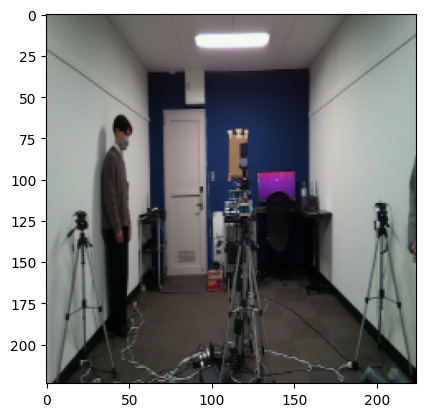

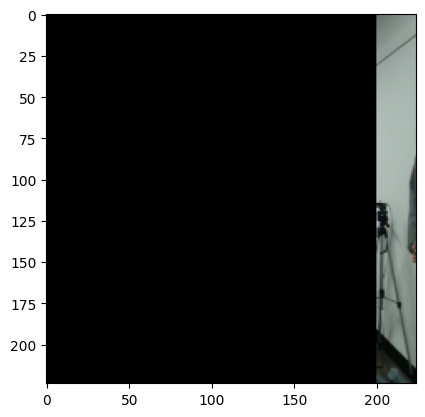

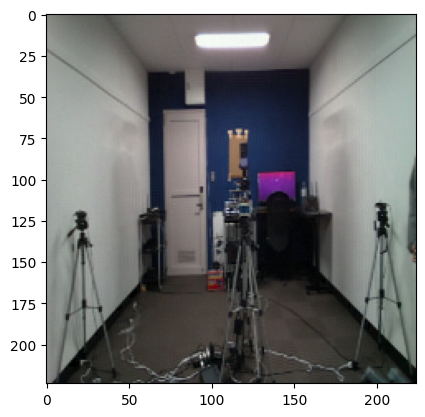

SSIM: 0.8715051
PSNR: 20.69392880536935
**************************************************************************************


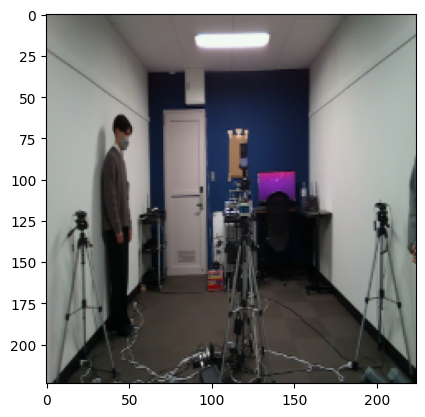

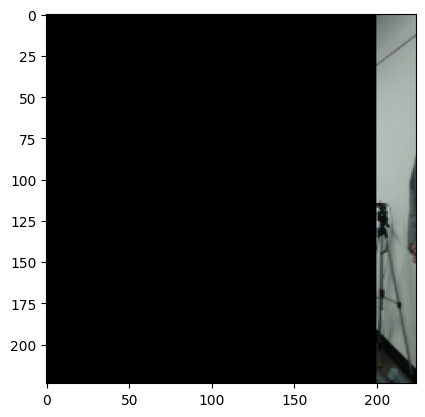

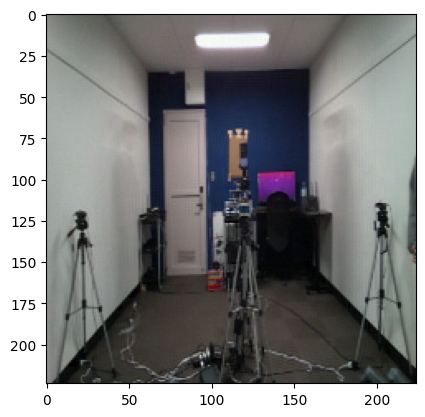

SSIM: 0.8696211
PSNR: 20.658469641920686
**************************************************************************************


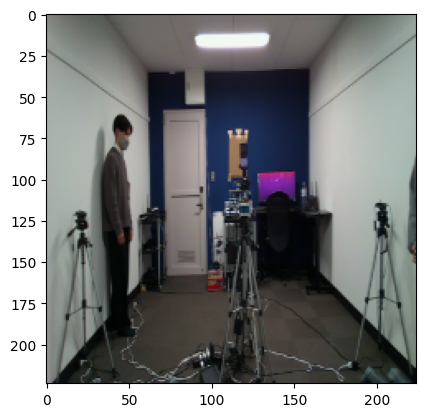

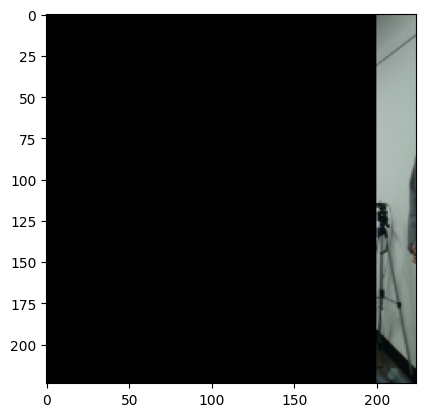

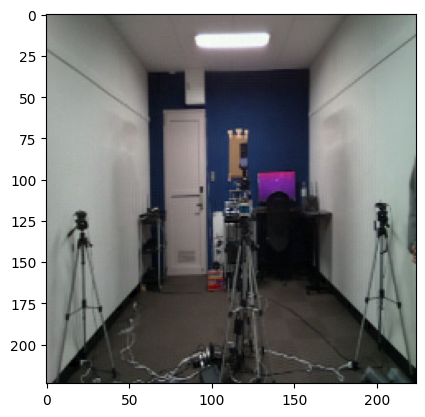

SSIM: 0.86951613
PSNR: 20.66661244640486
**************************************************************************************


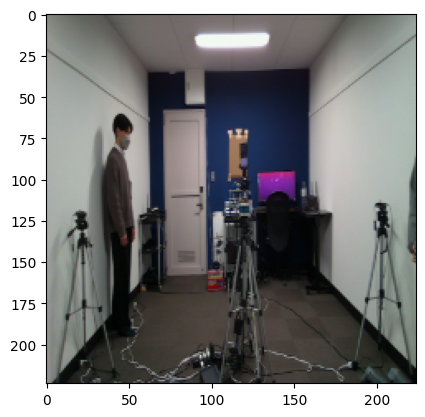

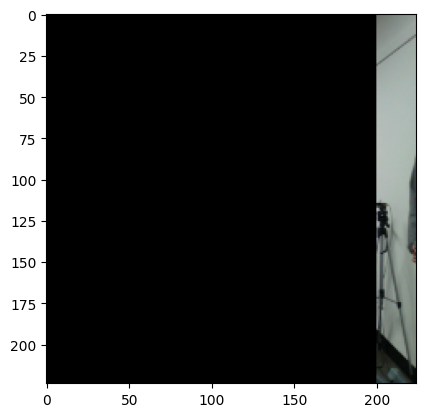

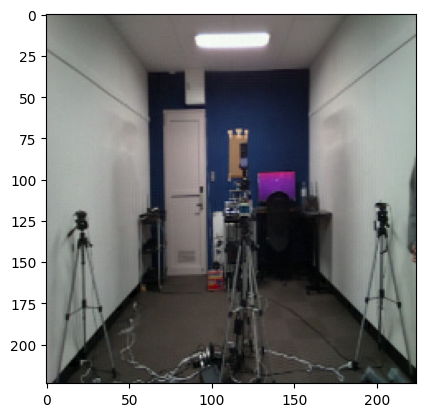

SSIM: 0.8670152
PSNR: 20.763705934177437
**************************************************************************************


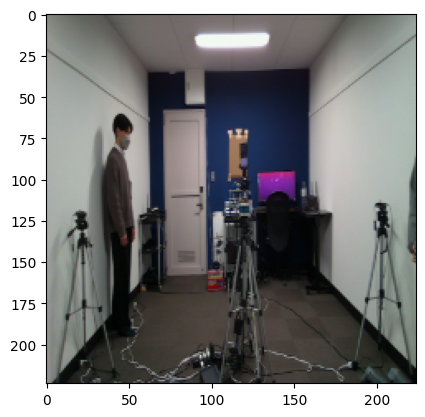

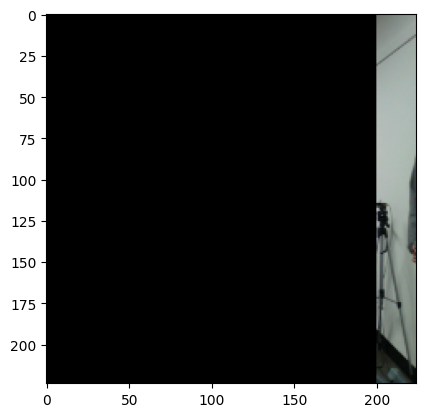

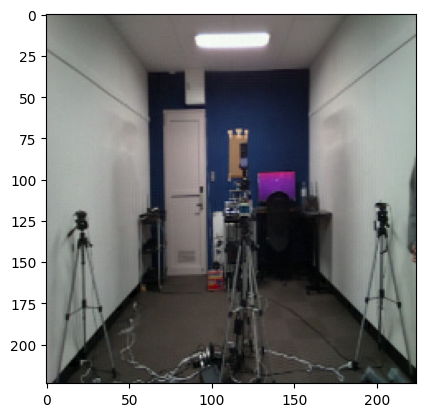

SSIM: 0.8670152
PSNR: 20.763705934177437
**************************************************************************************


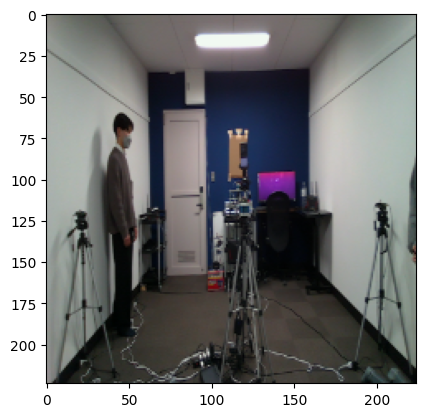

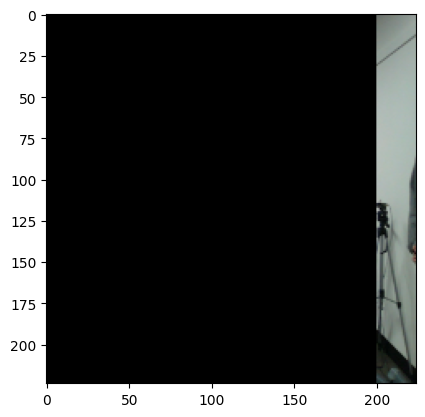

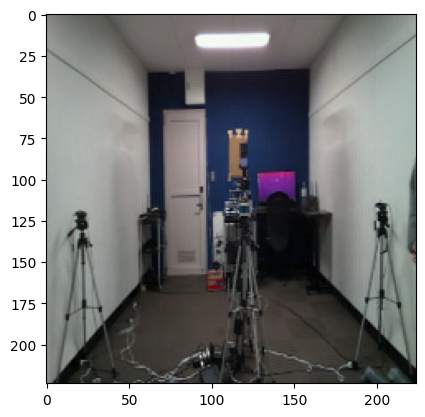

SSIM: 0.8653187
PSNR: 20.864265158465727
**************************************************************************************


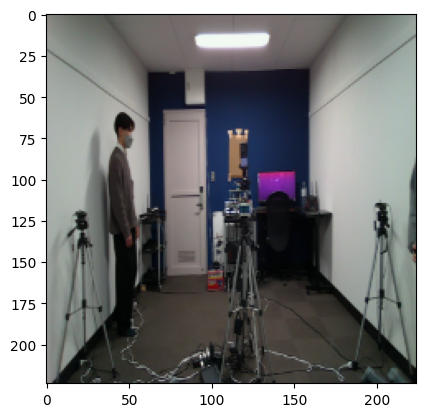

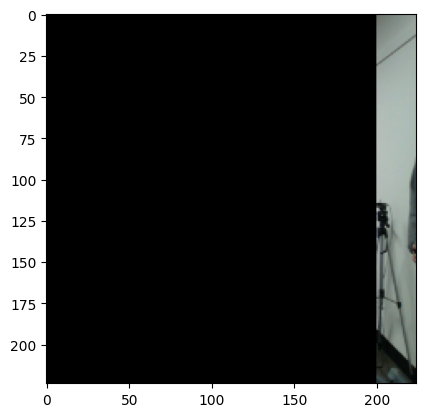

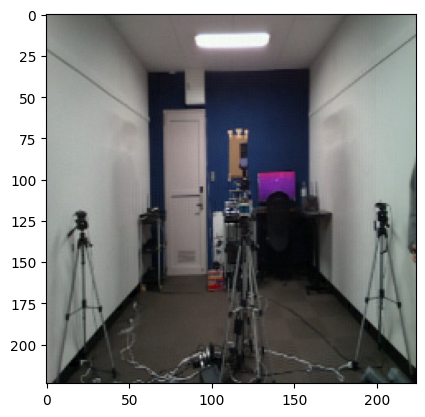

SSIM: 0.86259454
PSNR: 20.924051964208864
**************************************************************************************


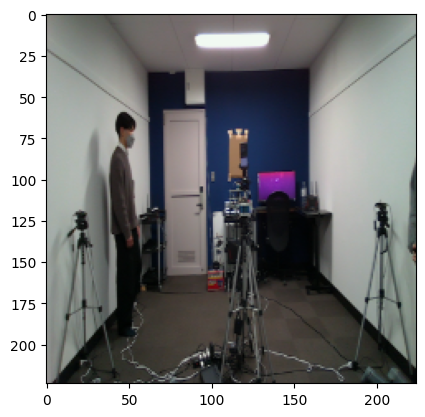

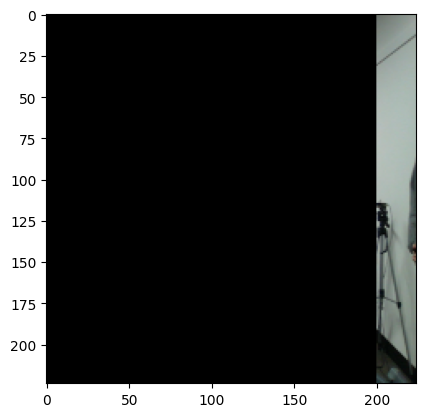

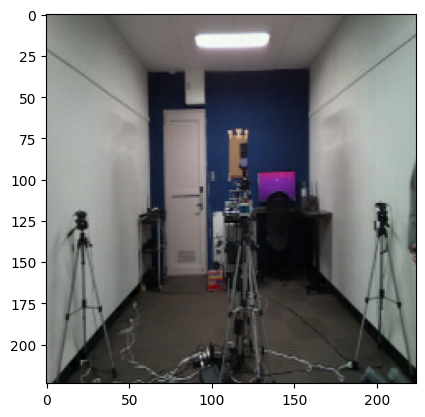

SSIM: 0.85973644
PSNR: 21.046821568491197
**************************************************************************************


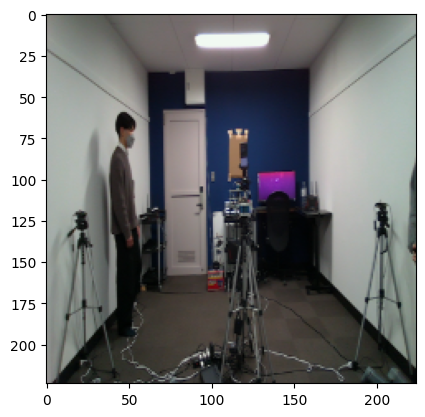

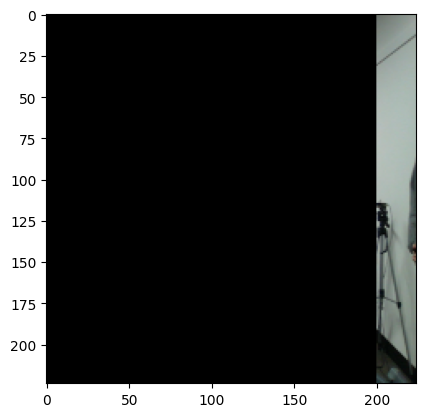

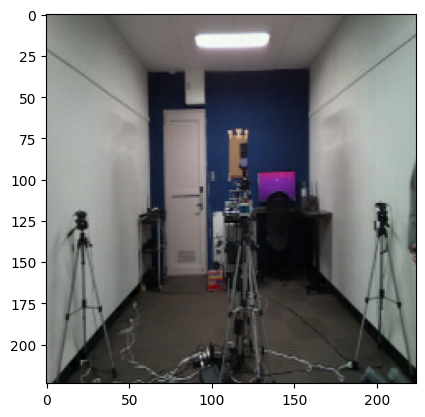

SSIM: 0.85973644
PSNR: 21.046821568491197
**************************************************************************************


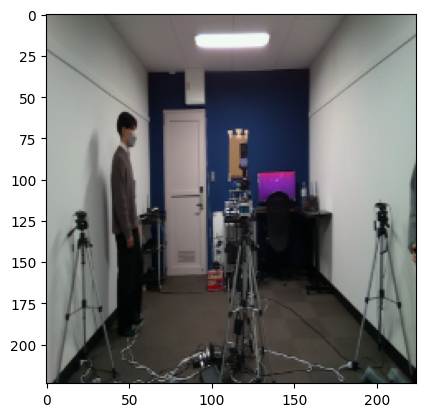

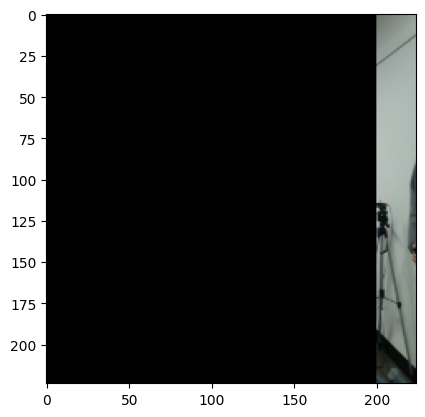

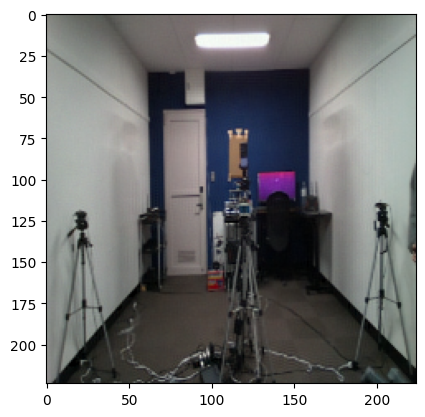

SSIM: 0.8563313
PSNR: 21.128340540834873
**************************************************************************************


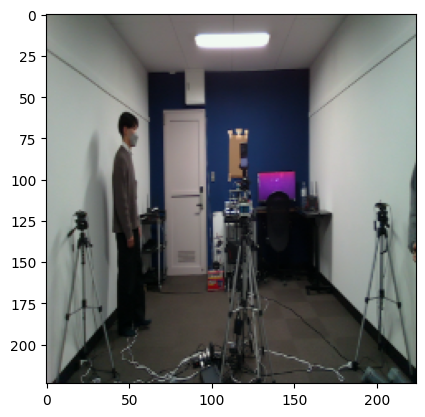

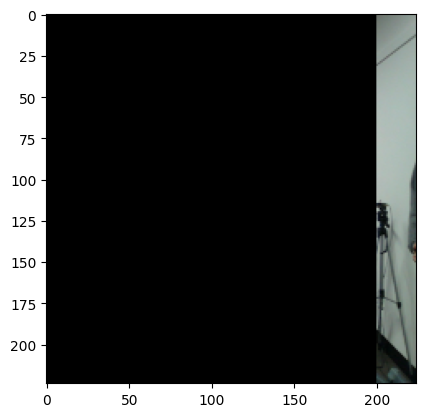

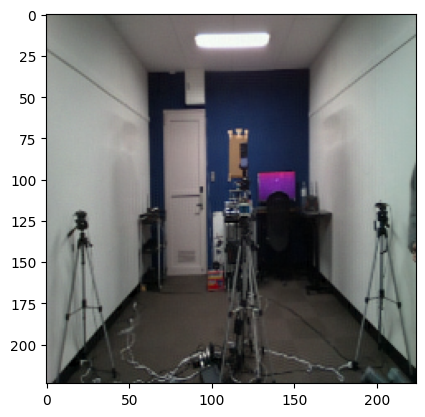

SSIM: 0.8553197
PSNR: 21.23598366641817
**************************************************************************************


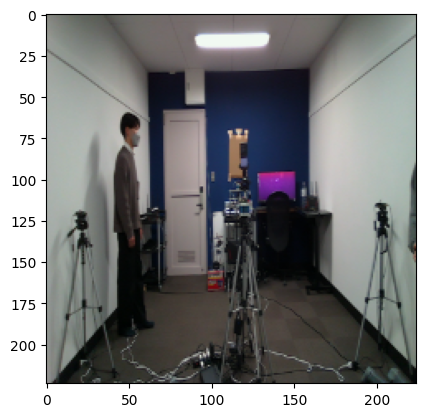

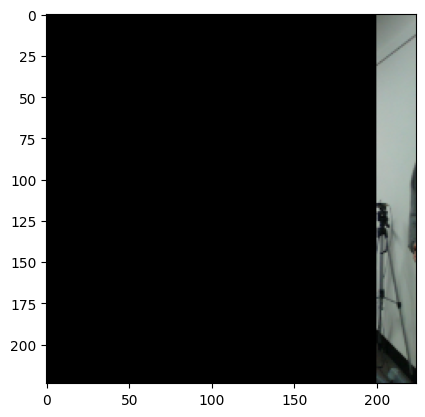

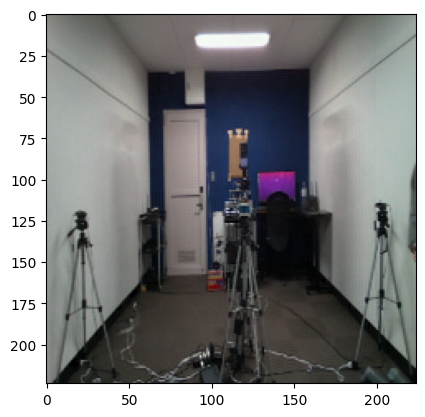

SSIM: 0.8549709
PSNR: 21.33498394245371
**************************************************************************************


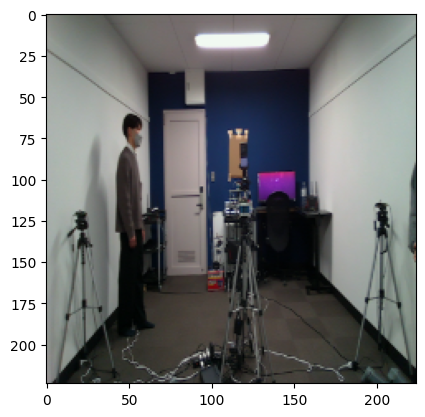

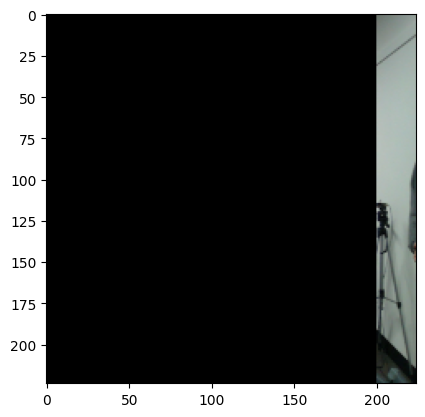

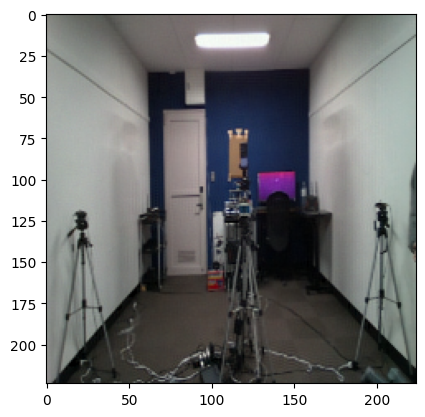

SSIM: 0.8522791
PSNR: 21.5163363864546
**************************************************************************************


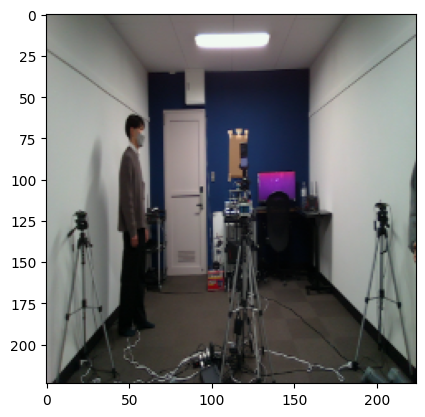

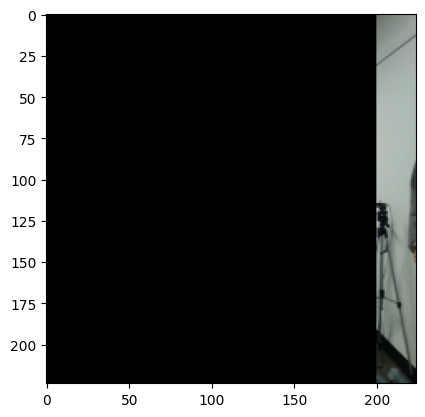

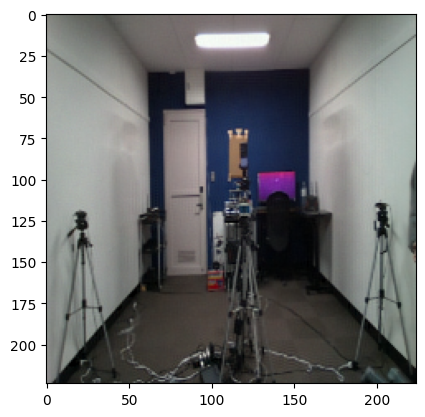

SSIM: 0.84952325
PSNR: 21.75890721773182
**************************************************************************************


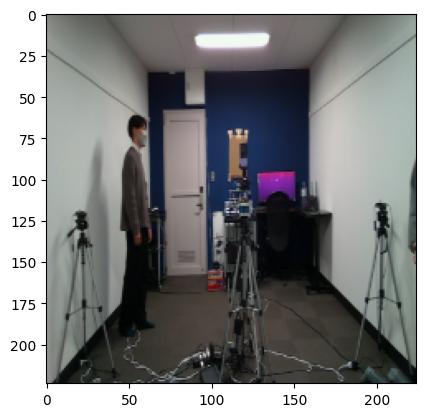

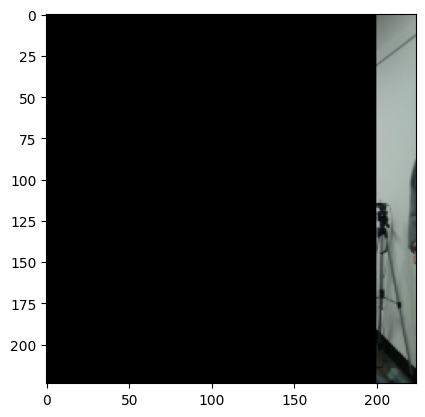

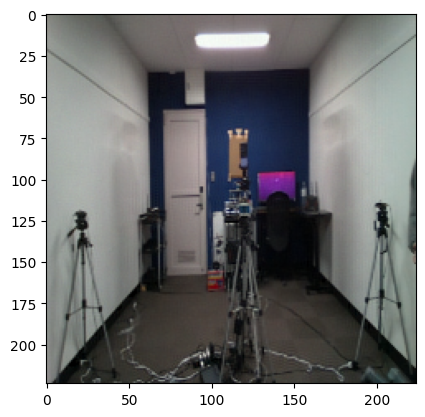

SSIM: 0.847461
PSNR: 22.02749351277904
**************************************************************************************


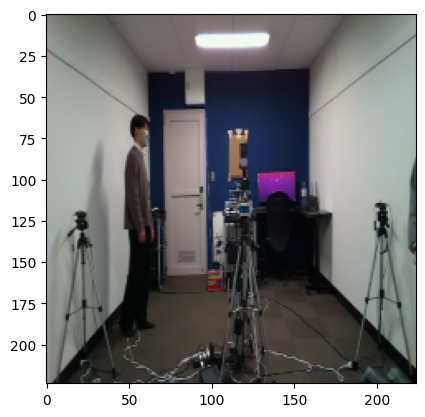

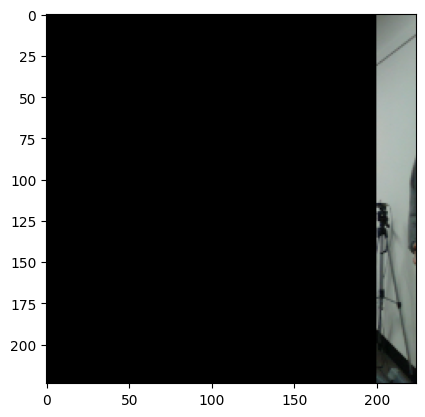

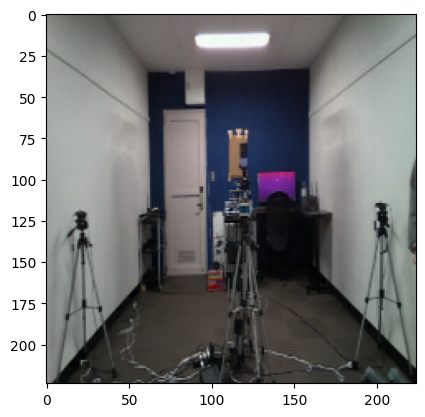

SSIM: 0.84659845
PSNR: 22.326802962038737
**************************************************************************************


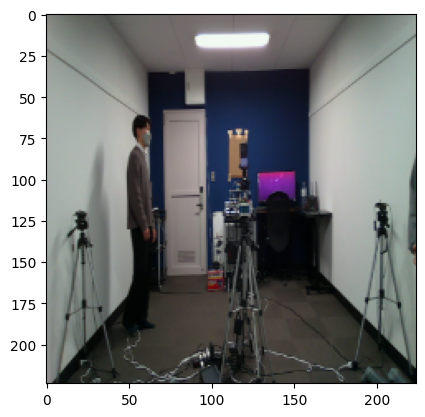

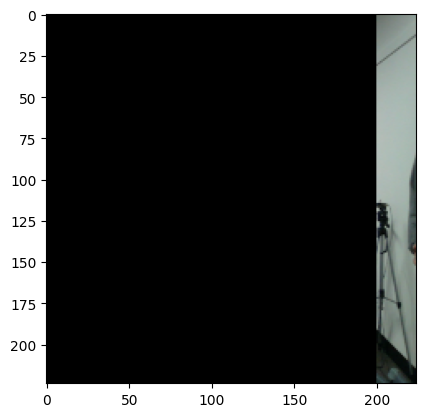

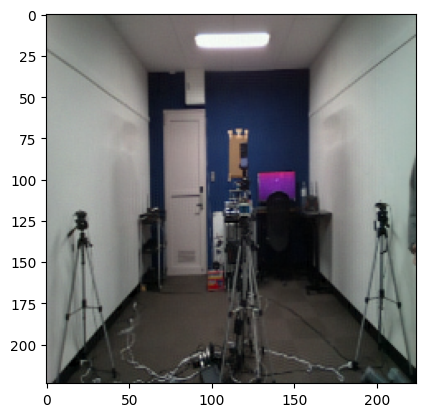

SSIM: 0.8491194
PSNR: 22.760900295917384
**************************************************************************************


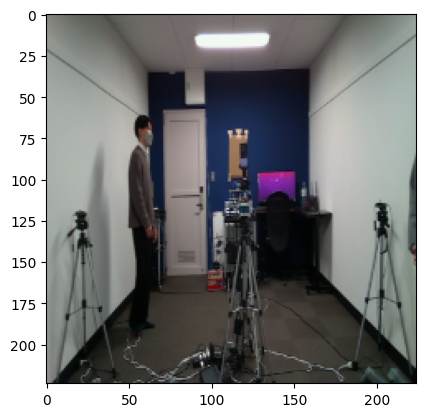

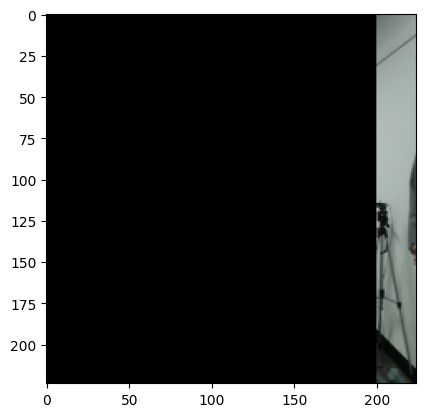

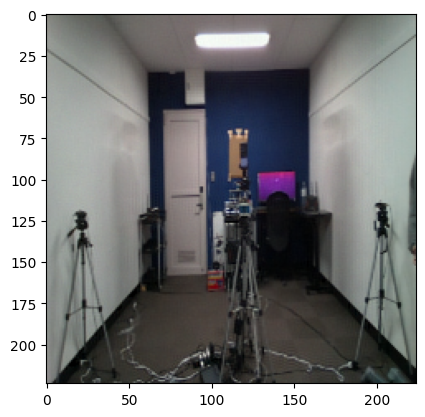

SSIM: 0.8519084
PSNR: 23.07865753937716
**************************************************************************************


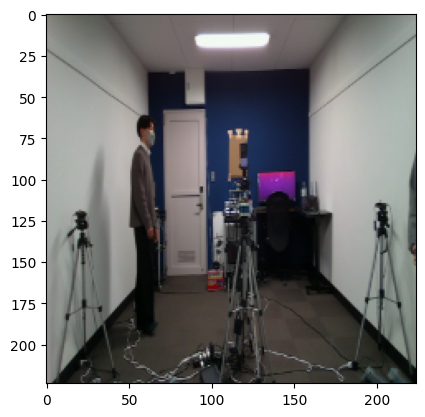

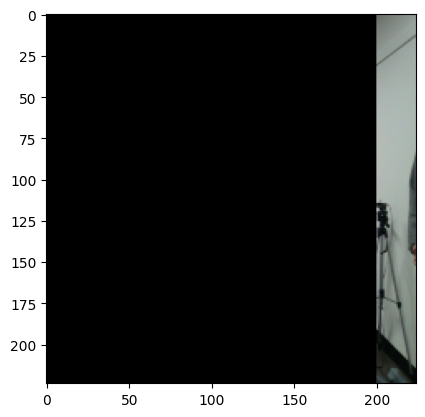

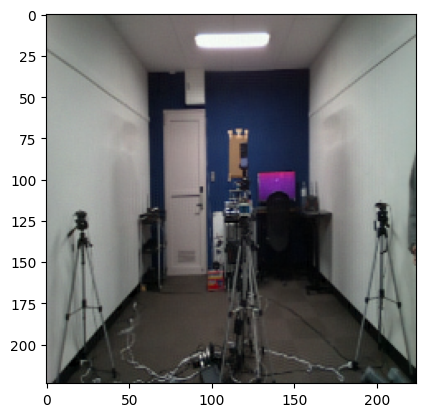

SSIM: 0.85330874
PSNR: 23.36772985483325
**************************************************************************************


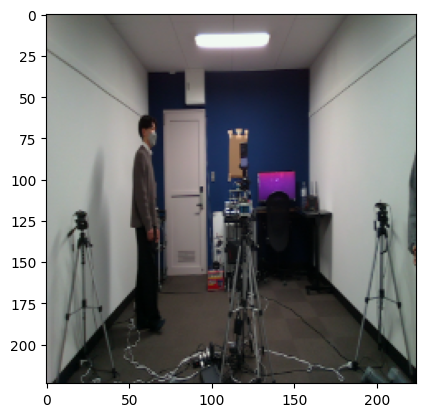

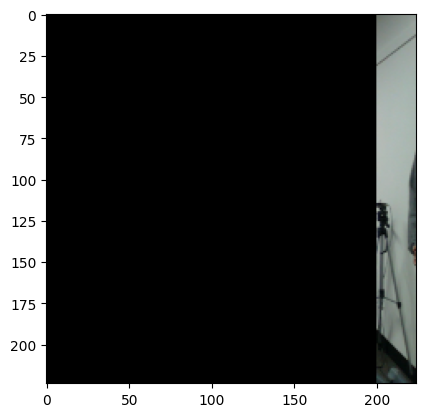

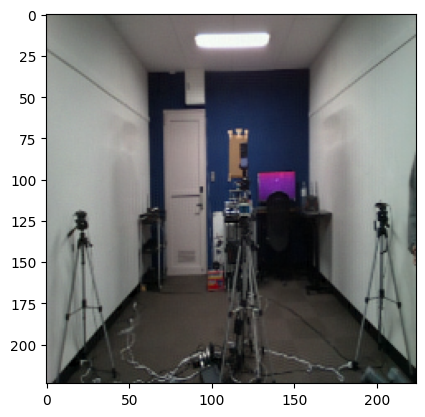

SSIM: 0.853576
PSNR: 23.622698542106022
**************************************************************************************


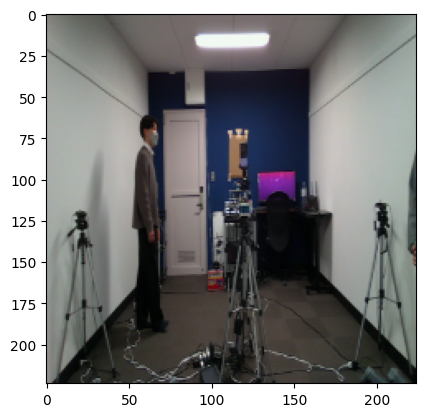

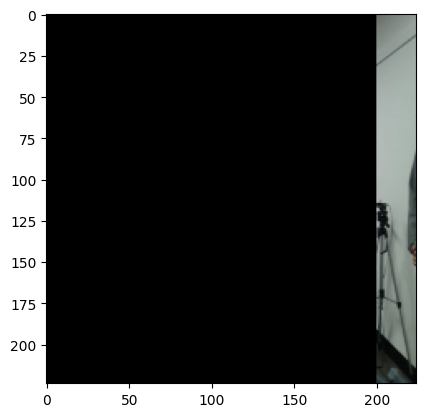

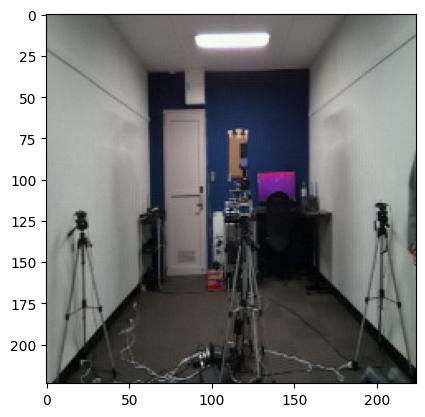

SSIM: 0.8546166
PSNR: 23.93959006307279
**************************************************************************************


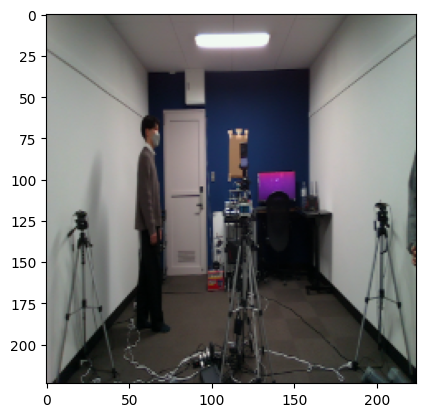

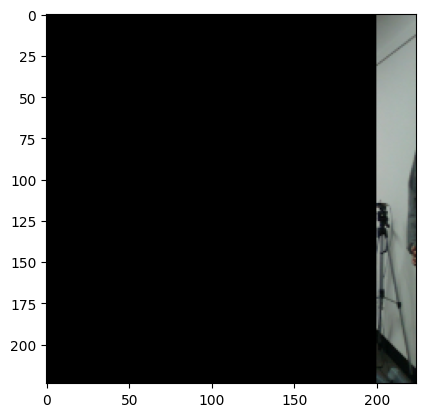

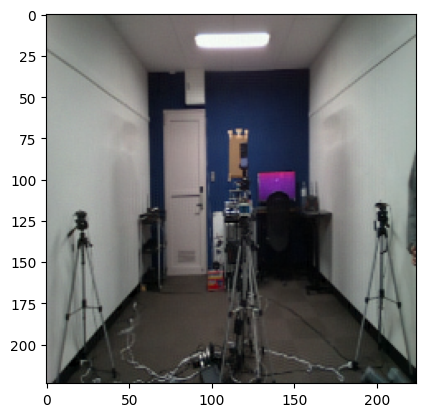

SSIM: 0.8543639
PSNR: 24.273813506085162
**************************************************************************************


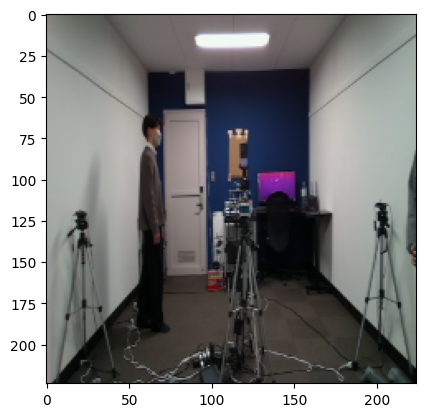

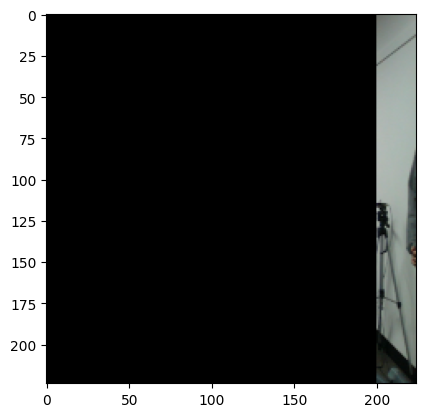

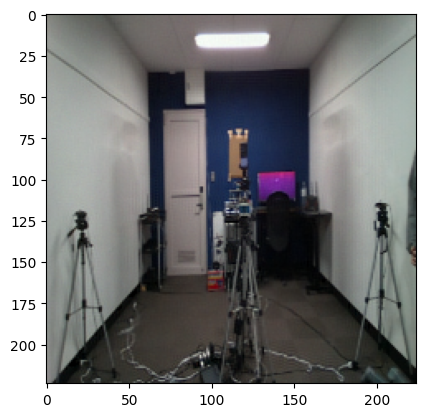

SSIM: 0.85826254
PSNR: 24.6507590472022
**************************************************************************************


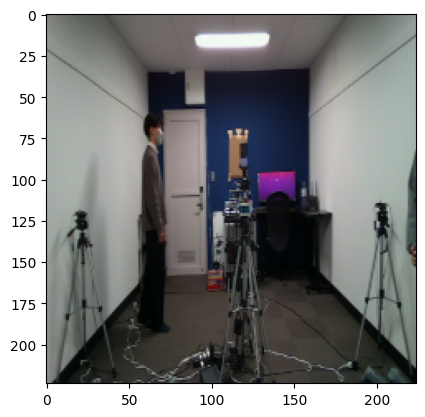

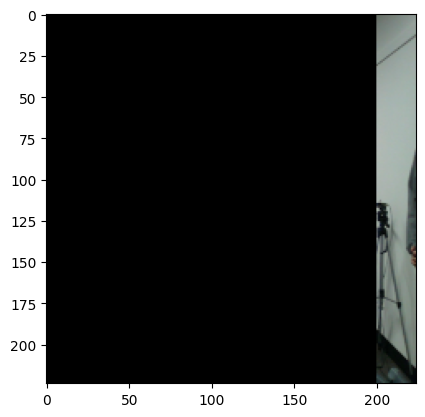

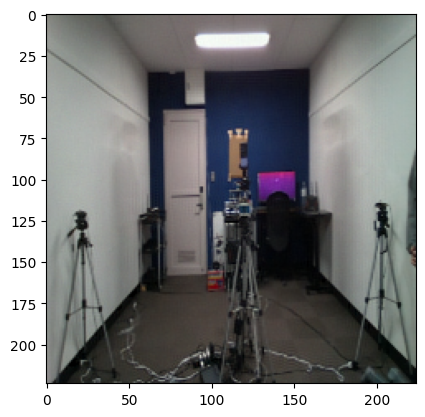

SSIM: 0.86134386
PSNR: 25.04977026115142
**************************************************************************************


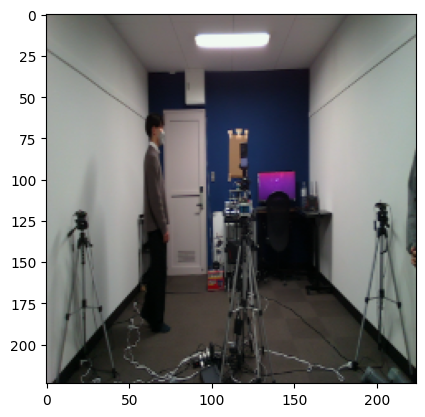

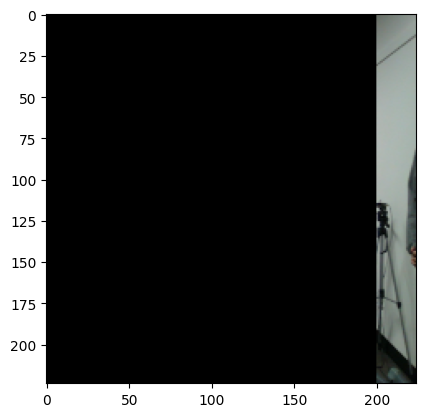

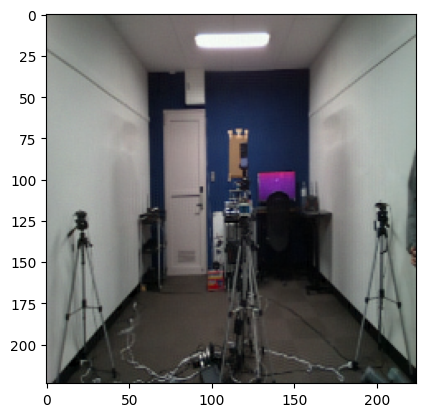

SSIM: 0.8651054
PSNR: 25.455947970494456
**************************************************************************************


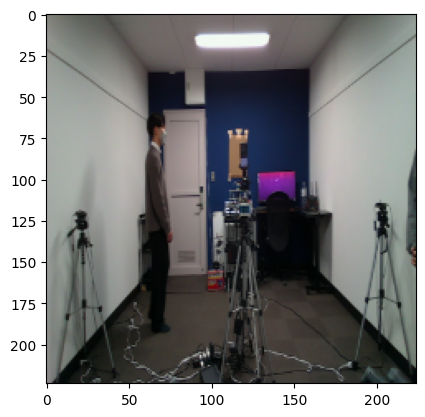

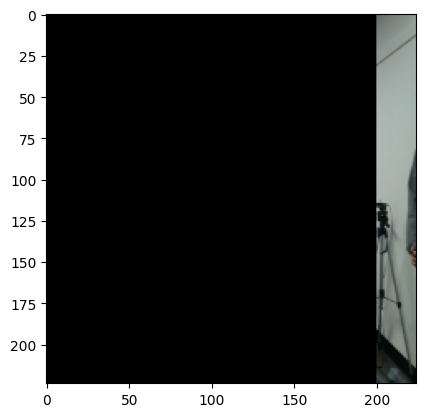

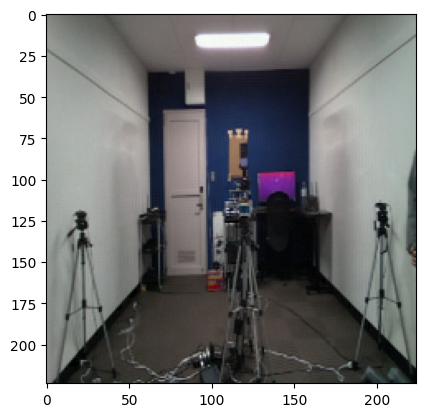

SSIM: 0.8674488
PSNR: 25.74509194121868
**************************************************************************************


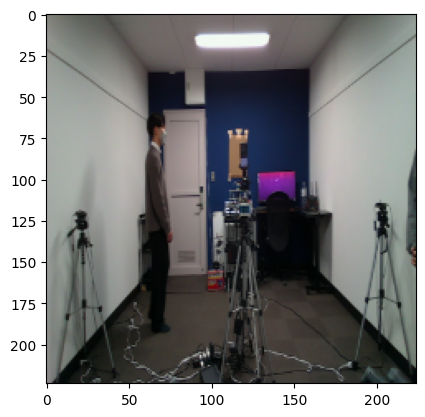

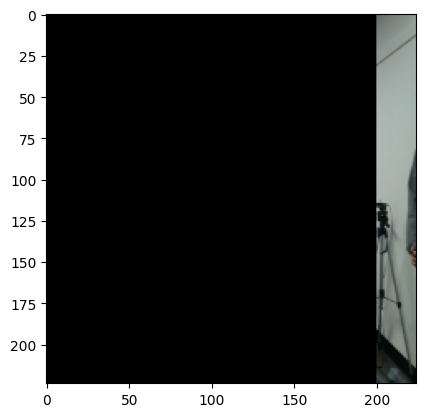

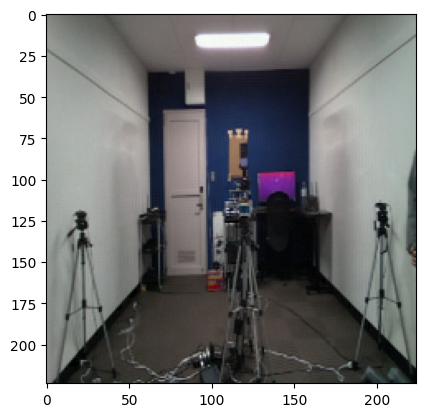

SSIM: 0.8674488
PSNR: 25.74509194121868
**************************************************************************************


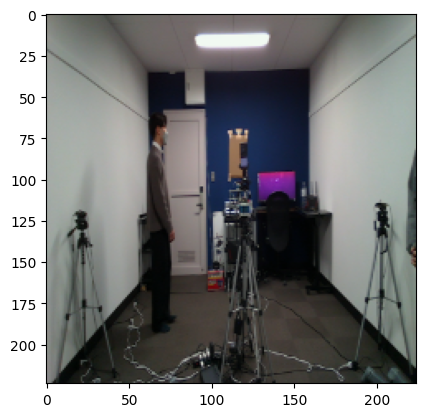

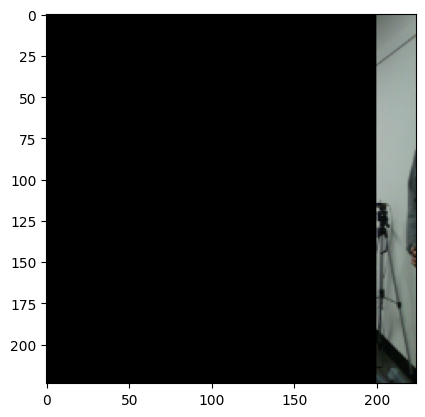

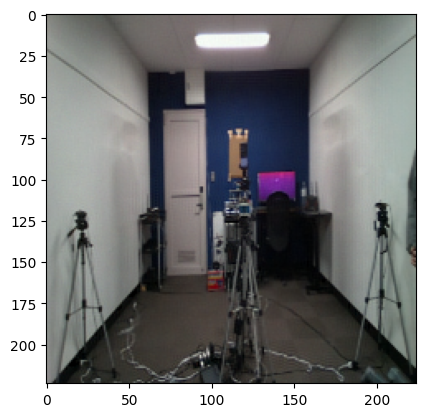

SSIM: 0.86662275
PSNR: 25.779479742420797
**************************************************************************************


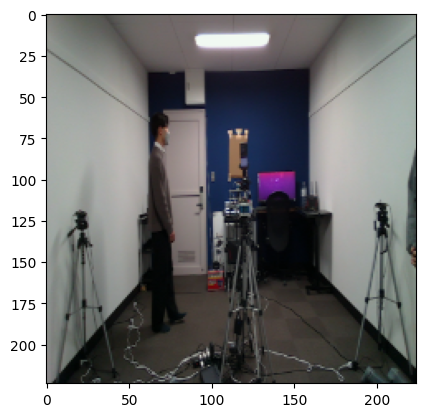

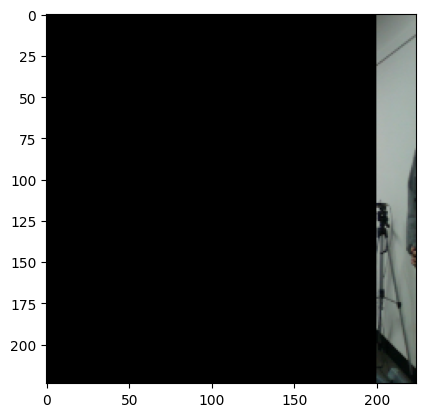

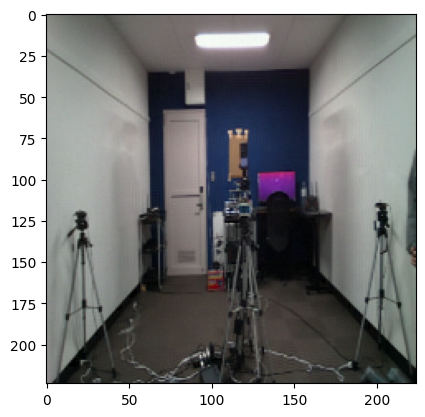

SSIM: 0.86493677
PSNR: 25.73726379015938
**************************************************************************************


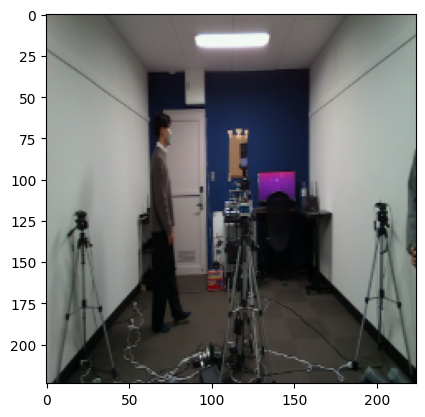

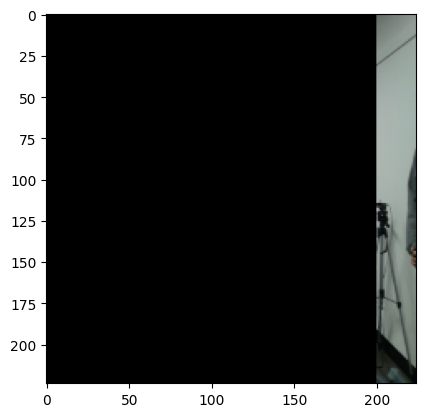

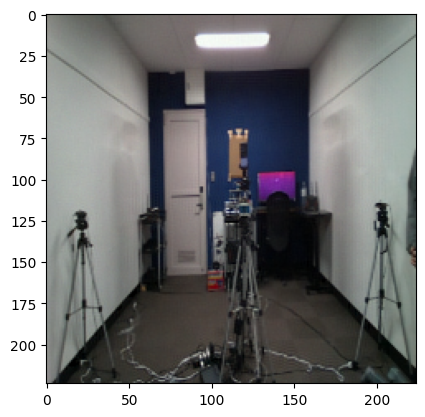

SSIM: 0.863183
PSNR: 25.615905125516086
**************************************************************************************


In [29]:
for i in range(820, 850):

    plt.imshow(test_gd_img[i])
    plt.show()
    
    plt.imshow(test_blocked_img[i])
    plt.show()

    plt.imshow(recovered_img[i])
    plt.show()
    
    print("SSIM:", ssim(test_gd_img[i], recovered_img[i], multichannel=True, win_size=11, channel_axis=2, data_range=1))
    print("PSNR:", skimage.metrics.peak_signal_noise_ratio(test_gd_img[i], recovered_img[i], data_range=1.0))
    
    print("**************************************************************************************")